<a href="https://colab.research.google.com/github/JAYANTHNITW/Dog_Vision-Project/blob/main/Dog_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# 🐶 End-to-End Multicalss Dog Breed Classification🐶
This notebook build an end to end multiclass image classifier using TensorFlow 2.0 and TensorFlow Hub
## 1. Problem:
Identifing the dog breed from the given image.

* Let's say I am having my dinner suddenly a dog came to eat with me, out of curiousity I want to what is the breed of this dog?

## 2. Data:
The data is taken from kaggle dog breed identification competition.
https://www.kaggle.com/competitions/dog-breed-identification/overview

## 3. Evaluation:
The evaluation is a file with prediction probabilites for each dog breed of each test image.
https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features:
Some information about the data

* We're dealing with images(unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 bod breeds ( This mean's there are 120 different classes).
* There are around 10000+ images in the training set( these images have labels).
* There are around 10000+ images in the test set( these images have no labels, because we'll want to predict them).


In [ ]:
# Unzip the data set.
#!unzip "drive/MyDrive/ Dog vision/dog-breed-identification.zip" -d "drive/MyDrive/ Dog vision"

### Get our workspace ready


In [3]:
import tensorflow as tf
print("TF version", tf.__version__)

TF version 2.12.0


In [4]:
import tensorflow_hub as hub
print("TensorFlow", hub.__version__)

TensorFlow 0.14.0


In [5]:
# check the gpu avaliability
print(" yes" if tf.config.list_physical_devices('GPU') else "no")


 yes


### Getting our data ready (turning into Tensors)

with all the ml models, our data has to be in numerical format. So that's what we'll be doing now. Turning our images into Tensors( Numerical representations)

Let's start by accessing our data and checking out the labels

In [7]:
# checkout the labels of our data
import pandas as pd
df_labels= pd.read_csv("drive/MyDrive/Dog vision/dog-breed-identificaton.zip/labels.csv")
print(df_labels.head())

                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [8]:
df_labels.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


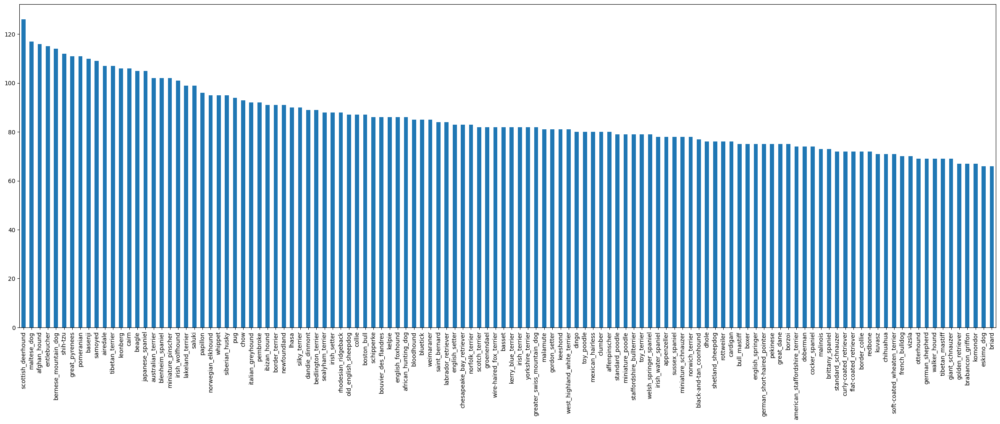

In [13]:
df_labels['breed'].value_counts().plot.bar(figsize=(30,10));

In [ ]:
# what is the median of the images per class
df_labels['breed'].value_counts().median()

82.0

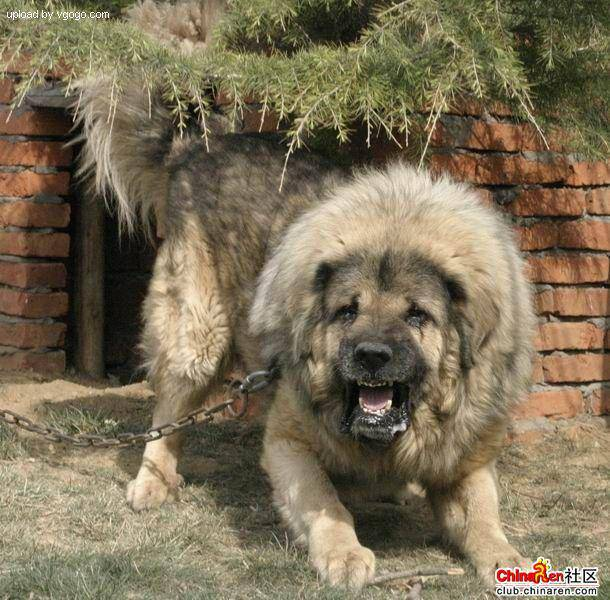

In [14]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog vision/train/e20e32bf114141e20a1af854ca4d0ecc.jpg")

In [17]:
# create the pathnames for each image
filenames= ['drive/MyDrive/Dog vision/train/'+ id + ".jpg" for id in df_labels['id']]
filenames[:10]

['drive/MyDrive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [16]:
# Check whether the no.of filenames is equal to no.of images in trainset
import os
if len(os.listdir('drive/MyDrive/Dog vision/train/'))==len(filenames):
  print("length matched proceed!✔️")

else:
  print('Length doesnot matched')

length matched proceed!✔️


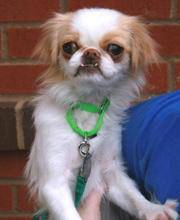

In [55]:
Image(filenames[666])

In [23]:
df_labels['breed'][10000]

'pembroke'

In [24]:
import numpy as np
labels = df_labels['breed'].to_numpy()
# labels = np.array(labels) # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [25]:
# see if number of breeds matches the no.of filenames
if len(labels)==len(filenames):
  print("Length matched")

else:
  print("not matched")

Length matched


In [26]:
# Finding the unique breeds
unique_breeds=df_labels['breed'].unique()
len(unique_breeds)

120

In [27]:
unique_breeds

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'borzoi', 'basenji', 'scottish_deerhound',
       'shetland_sheepdog', 'walker_hound', 'maltese_dog',
       'norfolk_terrier', 'african_hunting_dog',
       'wire-haired_fox_terrier', 'redbone', 'lakeland_terrier', 'boxer',
       'doberman', 'otterhound', 'standard_schnauzer',
       'irish_water_spaniel', 'black-and-tan_coonhound', 'cairn',
       'affenpinscher', 'labrador_retriever', 'ibizan_hound',
       'english_setter', 'weimaraner', 'giant_schnauzer', 'groenendael',
       'dhole', 'toy_poodle', 'border_terrier', 'tibetan_terrier',
       'norwegian_elkhound', 'shih-tzu', 'irish_terrier', 'kuvasz',
       'german_shepherd', 'greater_swiss_mountain_dog', 'basset',
       'australian_terrier', 'schipperke', 'rhodesian_ridgeback',
       'irish_setter', 'appenzeller', 'bloodhound', 'samoyed',
       'miniature_schnauzer', 'brittany_spaniel', 'kelpie', 'papillon',
       'borde

In [ ]:
# Turn a single breed into an array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([ True, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [29]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:3]

[array([ True, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False,  True, False, False, False, Fal

In [31]:
len(boolean_labels) ## boolean labels count will be same as lables, labels count will be same as breeds counts in df_labels dataframe i.e = 10222

10222

In [35]:
# Example: Turning boolean array into integers
print(labels[121]) # original breed
print(np.where(unique_breeds == labels[121])) # index where this label present in the 120 unique breeds
print(boolean_labels[121].argmax()) # index where label occurs in boolean array
print(boolean_labels[121].astype(int))

irish_terrier
(array([37]),)
37
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])

pekinese


In [ ]:
print(boolean_labels[2].astype(int))

[0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## Creating our own validation set


In [36]:
# setup x and y
x = filenames
y = boolean_labels

We're going to start off exprimenting with ~ 1000 images and increase as needed.

In [37]:
# set no. of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:'slider', min:1000,max:10000}

In [38]:
from sklearn.model_selection import train_test_split

x_train,x_val,y_train,y_val = train_test_split(x[:NUM_IMAGES],
                                               y[:NUM_IMAGES],
                                               test_size=0.2,
                                               random_state=42)
len(x_train),len(y_train),len(x_val),len(y_val)

(800, 800, 200, 200)

In [39]:
x_train[:5],y_train[:2]

(['drive/MyDrive/Dog vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False,  True, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

In [40]:
filenames[42]

'drive/MyDrive/Dog vision/train/011e06760794850c40f23d6426c40774.jpg'

### Preprocessing images (turning images to Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things.

* 1.Take an image file as input
* 2.Use Tensorflwo to read the file and save it to a variable image.
* 3.Turn our image (a jpg) into Tensors
* 4. Normilze our image (convert color channel values from 0-255 to 0-1)
* 5.Resize the image to be a shape of (224,224)
* 6.Return the modified image

In [102]:
# Convert image to numpy array
from matplotlib.pyplot import imread
image = imread(filenames[999])
# print(image)
# Image(filenames[42])

In [70]:
image1 = imread("/content/WhatsApp Image 2023-08-21 at 17.51.02.jpg")

In [50]:
filenames[1]

'drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg'

In [73]:
image1.shape

(1599, 899, 3)

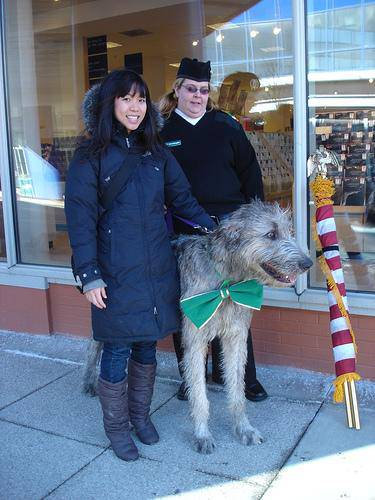

In [75]:
Image(filenames[999])


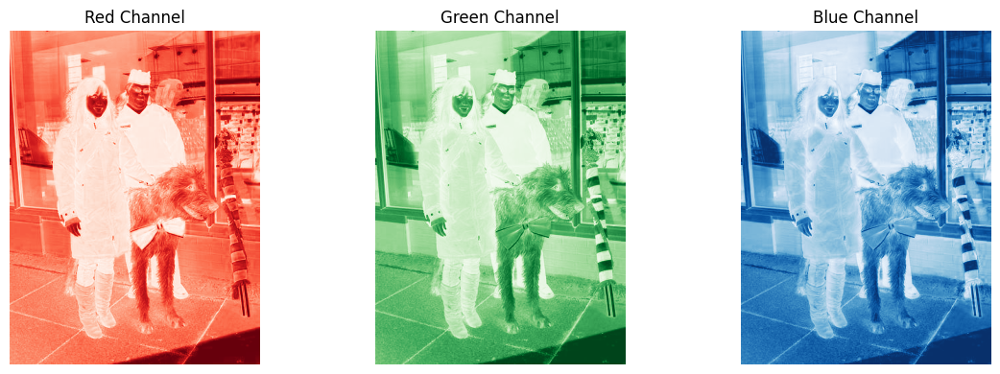

In [77]:
# Extract RGB color channels
red_channel = image[:, :, 0]
green_channel = image[:, :, 1]
blue_channel = image[:, :, 2]

# Create a figure with subplots
plt.figure(figsize=(12, 4))

# Plot the red channel
plt.subplot(1,3,1)
plt.imshow(red_channel, cmap='Reds')
plt.axis('off')
plt.title('Red Channel')

# Plot the green channel
plt.subplot(1, 3, 2)
plt.imshow(green_channel, cmap='Greens')
plt.axis('off')
plt.title('Green Channel')

# Plot the blue channel
plt.subplot(1, 3, 3)
plt.imshow(blue_channel, cmap='Blues')
plt.axis('off')
plt.title('Blue Channel')

plt.tight_layout()  # Adjust spacing between subplots
plt.show()

In [107]:
# all the pixel values
# np.set_printoptions(threshold=np.inf)
#print(image)
threshold = 500
np.set_printoptions(threshold=threshold)

In [45]:
image[42]

array([[46, 88, 76],
       [46, 88, 76],
       [47, 89, 79],
       ...,
       [38, 80, 58],
       [39, 78, 57],
       [39, 78, 57]], dtype=uint8)

In [79]:
image.max()

255

In [80]:
# changing the image into tensor
tf.constant(filenames[42])

<tf.Tensor: shape=(), dtype=string, numpy=b'drive/MyDrive/Dog vision/train/011e06760794850c40f23d6426c40774.jpg'>

In [108]:
tf.constant(image)

<tf.Tensor: shape=(500, 375, 3), dtype=uint8, numpy=
array([[[ 41,  58, 102],
        [102, 125, 166],
        [105, 140, 172],
        ...,
        [ 81, 155, 230],
        [ 81, 155, 230],
        [ 81, 155, 230]],

       [[ 42,  59, 103],
        [100, 123, 164],
        [107, 142, 174],
        ...,
        [ 99, 167, 238],
        [101, 169, 240],
        [103, 171, 242]],

       [[ 44,  61, 105],
        [ 95, 118, 159],
        [111, 146, 178],
        ...,
        [123, 183, 243],
        [125, 185, 245],
        [127, 187, 247]],

       ...,

       [[100, 129, 171],
        [ 97, 126, 168],
        [103, 132, 174],
        ...,
        [238, 247, 246],
        [238, 247, 246],
        [239, 248, 247]],

       [[105, 134, 176],
        [100, 129, 171],
        [103, 132, 174],
        ...,
        [233, 242, 241],
        [232, 241, 240],
        [232, 241, 240]],

       [[ 98, 127, 169],
        [ 92, 121, 163],
        [ 94, 123, 165],
        ...,
        [231, 240, 23

In [109]:
# turn image into a tensor
tf.constant(image)[1]

<tf.Tensor: shape=(375, 3), dtype=uint8, numpy=
array([[ 42,  59, 103],
       [100, 123, 164],
       [107, 142, 174],
       ...,
       [ 99, 167, 238],
       [101, 169, 240],
       [103, 171, 242]], dtype=uint8)>

In [111]:
# Difine image size
IMG_SIZE = 224

# create a function for preprocessing images
def process_image(image_path):
  """
  Takes an image file path and turns the image into a tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpg image into numerical Tensor with 3 color channels(Red, Green, Blue)
  image = tf.image.decode_jpeg(image,channels=3)
  # convert the color channel values from values from 0 to 255 to 0-1 values
  image = tf.image.convert_image_dtype(image,tf.float32)
  # Resize the image to our desired value (224,224)
  image = tf.image.resize(image,size = [IMG_SIZE, IMG_SIZE])

  return image

In [112]:
image = tf.io.read_file(x[42])
image

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\x01\x01^\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [113]:
tf.image.decode_jpeg(image,channels=3)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 88, 138,  87],
        [ 75, 125,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  84],
        [ 76, 134,  86],
        [ 75, 133,  85]],

       [[ 71, 120,  73],
        [ 65, 115,  66],
        [ 62, 112,  63],
        ...,
        [ 73, 131,  83],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 54, 105,  64],
        [ 56, 107,  66],
        [ 62, 113,  72],
        ...,
        [ 70, 127,  82],
        [ 71, 128,  83],
        [ 72, 129,  84]],

       ...,

       [[  2,  11,  10],
        [  4,  13,  10],
        [  6,  15,  12],
        ...,
        [119, 112,  66],
        [125, 119,  71],
        [121, 115,  67]],

       [[  0,   3,   7],
        [  0,   7,   9],
        [  2,   8,   4],
        ...,
        [104,  97,  51],
        [111, 104,  58],
        [109, 102,  56]],

       [[ 16,  18,  30],
        [ 14,  19,  23],
        [ 15,  20,  13],
        ...,
        [ 99,  92,  4

## Turning our data into batches
why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time ( you can manually adjust the batch size if needed.

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this: ( image, label)


In [94]:
# create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
    """
    Takes an image file path name and the associated label,
    process the image and returns a tuple of (image,label)

    """

    image = process_image(image_path)
    return image, label


In [92]:
tf.constant(y[42])

<tf.Tensor: shape=(120,), dtype=bool, numpy=
array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])>

In [96]:
x[42]

'drive/MyDrive/Dog vision/train/011e06760794850c40f23d6426c40774.jpg'

In [114]:
# Demo of the above
get_image_label(x[42],tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: ( image, label), let's make a function to turn all of our data (x & y) into batches


In [ ]:
# Define the batch size 32 is the good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x,y=None, batch_size= BATCH_SIZE, valid_data = False,test_data =False):
  """
  Create batches of data out of image (x), and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's vaildation data
  Also accepts test data as input (no labels)

  """
  # if the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only file path no labesl
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # if the data is valid dataset, we don't need to shuffle it .
  elif valid_data:
    print("Creating vaildation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches....")
    # Turn filepath and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    # shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # create (image, label) tuples (this also turns the image path into a preprocessed images)
    data = data.map(get_image_label)

    # Trn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch



In [ ]:
# creating training and validation batches
train_data = create_data_batches(x_train,y_train)
val_data = create_data_batches(x_val,y_val,valid_data = True)

Creating training data batches....
Creating vaildation data batches...


In [ ]:
# check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing the Data Batches

our data is now in batches, however these can be a little hard to understand/comphrend, let's visualize them

In [ ]:
import matplotlib.pyplot as plt

# create a funciton for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch

  """

  # setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 ( for displaying 25 images)
  for i in range(25):
    # create subplots (5 rows, 5 columns)
    ax = plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn grid lines off
    plt.axis('off')

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

### doing unbatching

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[9.00175154e-01, 8.16036463e-01, 7.21918762e-01],
          [8.93785059e-01, 7.87517607e-01, 6.45955920e-01],
          [9.14811015e-01, 7.65371203e-01, 5.52853703e-01],
          ...,
          [9.17647123e-01, 9.07300353e-01, 9.69713211e-01],
          [9.17647123e-01, 9.09803987e-01, 9.64705944e-01],
          [9.17647123e-01, 9.09803987e-01, 9.64705944e-01]],
 
         [[9.00175154e-01, 8.16036463e-01, 7.21918762e-01],
          [8.93785059e-01, 7.87517607e-01, 6.45955920e-01],
          [9.14811015e-01, 7.65371203e-01, 5.52853703e-01],
          ...,
          [9.17647123e-01, 9.07300353e-01, 9.69713211e-01],
          [9.17647123e-01, 9.09803987e-01, 9.64705944e-01],
          [9.17647123e-01, 9.09803987e-01, 9.64705944e-01]],
 
         [[9.00175154e-01, 8.16036463e-01, 7.21918762e-01],
          [8.93785059e-01, 7.87517607e-01, 6.45955920e-01],
          [9.14811015e-01, 7.65371203e-01, 5.52853703e-01],
          ...,
          [9.17647123e-01, 9.07021821e-01, 9.7027

In [ ]:
len(train_images), len(train_labels)

(32, 32)

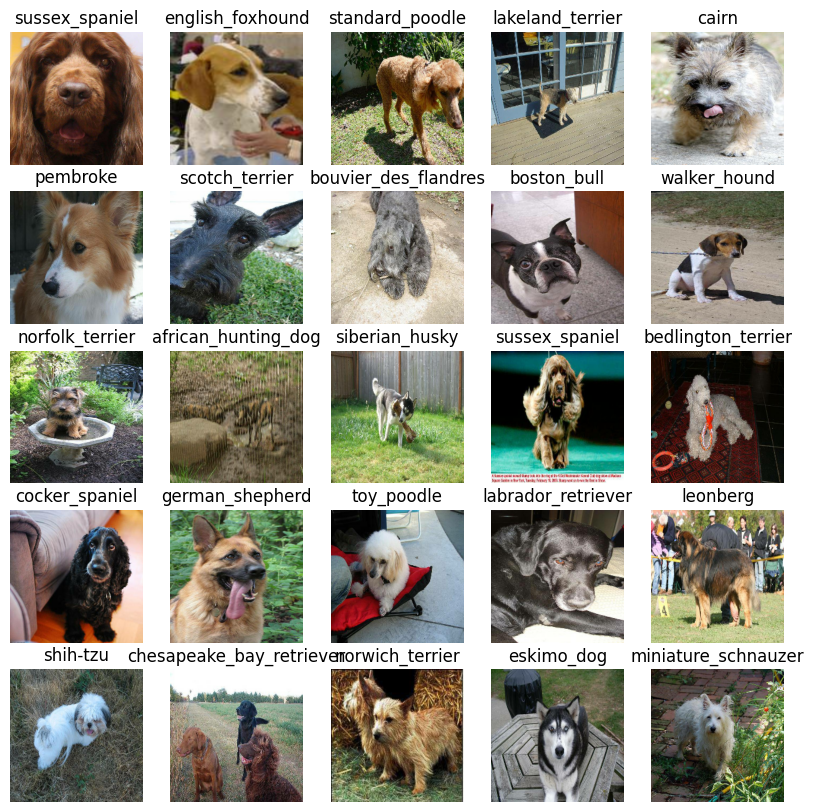

In [ ]:
show_25_images(train_images,train_labels)

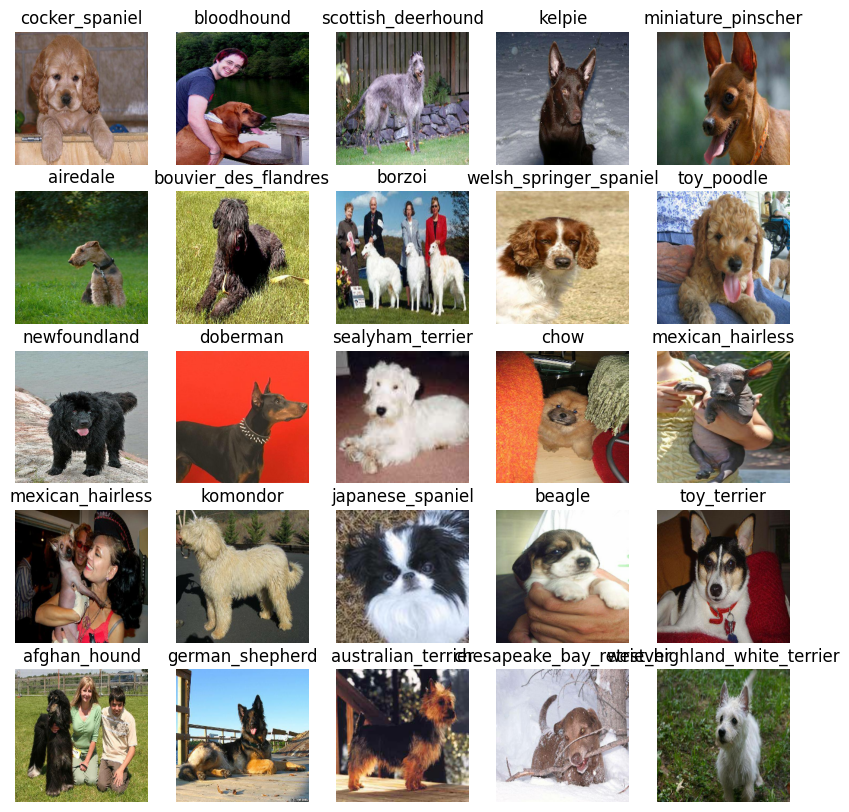

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Building a model

Before we build a model,there are a few things we need to define:

* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* the URL of the model we want to use.

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got our imput's, output's and model ready to go.
Let's put them together into a keras deep learning model.

Knowing this, let's create a funciton which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion( do this first, then this, then that).
* Complies the model (says it should be evaluated and improved).
* Builds hte model ( tells the model the input shape it'll ge getting)
* Finally returns the model

In [ ]:
# Create a function which builds a keras model
def create_model(input_shape=INPUT_SHAPE, output_shape= OUTPUT_SHAPE,  model_url = MODEL_URL):
  print("Building a model with", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # Layer 2 (output layer)

  ])

  # Complie the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']
  )

  # Build the model
  model.build(INPUT_SHAPE)
  return model


In [ ]:
model = create_model()
model.summary()

Building a model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training a model stops improving.

* We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### 1. TensorBorad Callback
To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the '%tensorboard' magic function (we'll do this after model training).

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorborad_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join('/content/drive/MyDrive/ Dog vision/logs',
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### 2. EarlyStopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

In [ ]:
# Create early stopping callbacks
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3,)

### Training a model(on subset of data)

our first model is only going to train on 1000 images, to make sure everything is working

In [ ]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100,step:10}

In [ ]:
# Check to make sure that we are stilll runnin on the gpu
if tf.config.list_physical_devices('GPU'):
  print('GPU is avaliable Yessssssssssss!')
else:
  print('NO')

GPU is avaliable Yessssssssssss!


In [ ]:
# Build a funciton to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """

  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a  model
  tensorboard = create_tensorborad_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model

In [ ]:
model = train_model()

Building a model with https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
77/77 [==============================] - 1187s 15s/step - loss: 2.9397 - accuracy: 0.3670 - val_loss: 1.2931 - val_accuracy: 0.6868
Epoch 2/100
77/77 [==============================] - 12s 151ms/step - loss: 0.5914 - accuracy: 0.8772 - val_loss: 0.9262 - val_accuracy: 0.7520
Epoch 3/100
77/77 [==============================] - 15s 195ms/step - loss: 0.2654 - accuracy: 0.9592 - val_loss: 0.8404 - val_accuracy: 0.7602
Epoch 4/100
77/77 [==============================] - 10s 132ms/step - loss: 0.1484 - accuracy: 0.9857 - val_loss: 0.8024 - val_accuracy: 0.7651
Epoch 5/100
77/77 [==============================] - 10s 132ms/step - loss: 0.0952 - accuracy: 0.9963 - val_loss: 0.7759 - val_accuracy: 0.7667
Epoch 6/100
77/77 [==============================] - 11s 144ms/step - loss: 0.0669 - accuracy: 0.9984 - val_loss: 0.7641 - val_accuracy: 0.7700
Epoch 7/100
77/77 [=======================

### Checking the TensorBorad logs
The TensorBorad magic function(`%tensorboard`) will access the logs directory we createed earlier
 and visualize its contens.


In [ ]:
%tensorboard --logdir /content/drive/MyDrive/\ Dog\ vision/logs --port 6008


<IPython.core.display.Javascript object>

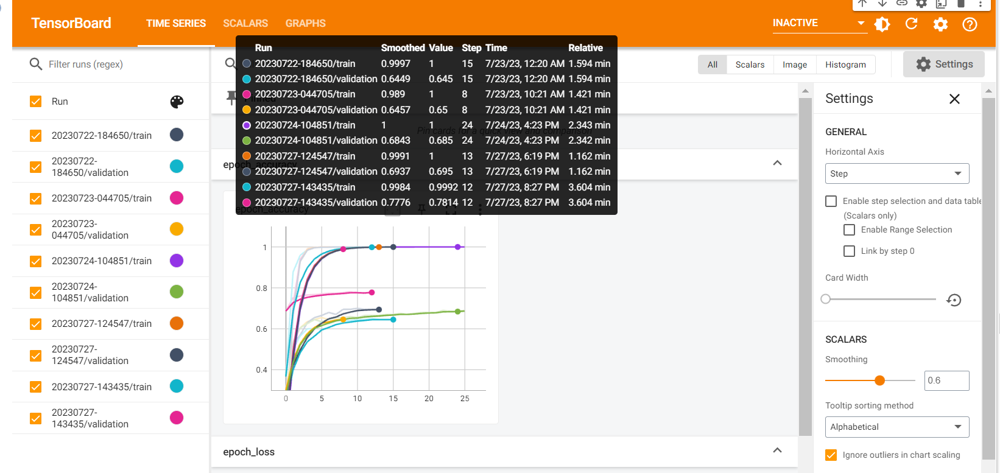

In [115]:
Image("/content/drive/MyDrive/Dog vision/logs/Screenshot 2023-08-21 184448.png")

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data,verbose=1)
predictions

20/20 [==============================] - 7s 96ms/step


array([[4.7153125e-07, 1.2007998e-05, 9.9210592e-06, ..., 3.2895030e-05,
        2.6635501e-01, 5.5936184e-06],
       [3.0881793e-08, 4.6624200e-06, 2.5343957e-07, ..., 2.1018138e-08,
        5.7497402e-07, 4.1276016e-07],
       [6.0994343e-10, 9.9928172e-08, 6.0946577e-09, ..., 8.5201393e-09,
        2.3727222e-09, 9.3531352e-09],
       ...,
       [1.4775541e-05, 1.6917325e-04, 2.2068094e-04, ..., 7.0820199e-05,
        2.2816606e-04, 2.7348129e-05],
       [7.4286604e-06, 1.2352195e-04, 3.2025025e-07, ..., 1.4030222e-05,
        7.8174099e-07, 3.5698928e-08],
       [7.0815739e-05, 2.5891082e-05, 9.2947894e-06, ..., 3.9413871e-07,
        1.3936781e-06, 2.6448953e-04]], dtype=float32)

In [ ]:
len(predictions[0])

120

Having the above functionality is great but we want to be able to do it at scale
And it would be even better if we could see the image the prediction is being made on!

Note: Prediction probabilites are aslo known as confidence levels


In [ ]:
# Turn prediction probabilites into their respective labels ( easy to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on a array of prediction probabilities
pred_label = get_pred_label(predictions[8])
pred_label

'welsh_springer_spaniel'

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# create a function to unbacth a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images,labels

# unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.46219388, 0.34591237, 0.2269873 ],
         [0.46862748, 0.35234594, 0.23566319],
         [0.48293945, 0.35426298, 0.25027022],
         ...,
         [0.37647063, 0.33757   , 0.33427867],
         [0.38623083, 0.33132884, 0.32740727],
         [0.39730427, 0.34240228, 0.3384807 ]],
 
        [[0.4310494 , 0.3490028 , 0.26700002],
         [0.43827033, 0.35622373, 0.2808869 ],
         [0.45130432, 0.36042893, 0.2983491 ],
         ...,
         [0.37647063, 0.33757   , 0.33427867],
         [0.39676127, 0.34185928, 0.3379377 ],
         [0.40943635, 0.35453436, 0.3506128 ]],
 
        [[0.38194913, 0.34585842, 0.31368932],
         [0.38843665, 0.3496586 , 0.32801998],
         [0.40244517, 0.35395947, 0.34171334],
         ...,
         [0.37647063, 0.33757   , 0.33427867],
         [0.40989152, 0.35498953, 0.35106796],
         [0.42091107, 0.3660091 , 0.36208752]],
 
        ...,
 
        [[0.7723482 , 0.5997992 , 0.48607376],
         [0.74055123, 0.5680022 , 0.45427

In [ ]:
# images_ = []
# labels_ = []

# # loop through unbatched data
# for image, label in val_data.unbatch().as_numpy_iterator():
#   images_.append(image)
#   labels_.append(label)

# images_[0], labels_[0]

Now we've got ways to get :
* Prediction labels
* validation labels (truth labels)
* validation images

Let's make some function to make these all a bit more visualize

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(labels,prediction_probabilities,images,n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # plot image & remove ticks
  plt.imshow(image)
  # plt.xticks([])
  # plt.yticks([])

  if true_label == pred_label:
    color='green'
  else:
    color='red'

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                   np.max(pred_prob)*100,
                                   true_label),
                                    color=color)

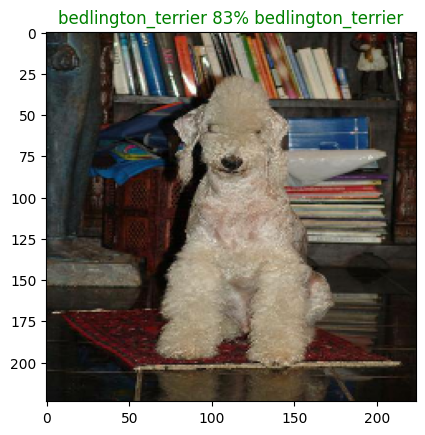

In [ ]:
plot_pred(labels=val_labels,
          prediction_probabilities=predictions,
          images=val_images,n=99)

Now we've got one function to visualize our models top prediction, let's make another to view our top 10 predictions

This funciton will:
* Take an input of prediction probabilities array and a ground truth array and an interger✅
* Find the prediction using get_pred_label()✅
* Find the top 10:
  * Prediction probabilites indexes✅
  * Prediction probabilities values✅
  * prediction labels✅
* Plot the top10 predictions values and labels, coloring the true label green✅

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  The top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predictied label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction probabilities or confidences indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation='vertical')

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color('green')
  else:
    pass

In [ ]:
predictions[99]

array([5.09966731e-06, 3.92485454e-05, 7.58706676e-07, 1.68427912e-04,
       3.76343041e-06, 8.29874992e-01, 7.30049724e-05, 6.01663305e-05,
       3.09386582e-04, 5.00998397e-07, 3.17930499e-05, 3.66952387e-04,
       2.50242988e-06, 6.15179533e-06, 1.10105400e-04, 1.21453684e-06,
       1.39240769e-03, 1.18371679e-06, 3.44467117e-05, 1.03752166e-06,
       4.51885026e-05, 3.91393842e-04, 6.27041061e-07, 6.73465984e-05,
       5.80130582e-05, 4.19161479e-05, 3.15008692e-05, 4.98518602e-05,
       5.95428246e-05, 1.54099307e-05, 5.60459193e-06, 1.13396379e-06,
       1.36250705e-02, 2.16791864e-06, 1.02762424e-04, 1.25058158e-03,
       1.67533057e-04, 7.24955498e-06, 1.39410768e-04, 6.14938187e-07,
       2.06301804e-04, 3.66058317e-04, 4.94879750e-05, 7.06198625e-06,
       9.12651285e-06, 1.09739067e-05, 1.99065908e-05, 1.81575865e-06,
       1.52722670e-04, 2.78098014e-04, 1.21757648e-06, 1.07242877e-05,
       1.69041741e-05, 3.27299722e-06, 2.55099403e-05, 9.39056281e-06,
      

In [ ]:
unique_breeds[np.argmax(predictions[99])]

'bedlington_terrier'

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# unbatchify the train data
train_images, train_labels = unbatchify(train_data)
train_images[0], train_labels[0]

(array([[[0.21719189, 0.17405462, 0.08778011],
         [0.21921325, 0.17607598, 0.08980148],
         [0.18557425, 0.14243698, 0.05616248],
         ...,
         [0.01568628, 0.01568628, 0.01568628],
         [0.01568628, 0.01568628, 0.01568628],
         [0.01568628, 0.01568628, 0.01568628]],
 
        [[0.2172087 , 0.17407143, 0.08779691],
         [0.21964498, 0.17650771, 0.09023321],
         [0.18949582, 0.14635855, 0.06008404],
         ...,
         [0.02352941, 0.02352941, 0.02352941],
         [0.02352941, 0.02352941, 0.02352941],
         [0.02352941, 0.02352941, 0.02352941]],
 
        [[0.22035308, 0.17721581, 0.0909413 ],
         [0.22334209, 0.18020482, 0.09393031],
         [0.19218314, 0.14904587, 0.06277137],
         ...,
         [0.02352941, 0.02352941, 0.02352941],
         [0.02352941, 0.02352941, 0.02352941],
         [0.02352941, 0.02352941, 0.02352941]],
 
        ...,
 
        [[0.08353457, 0.09922085, 0.11098555],
         [0.09830163, 0.1139879 , 0.12575

In [ ]:
# for label in train_labels:
#   if label== 'english_foxhound':
#     print('yes')

yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes


It is very important to note that `argsort` function used to find the indexes of the probabilites.

In [ ]:
[predictions[0].argsort()[-10:][::-1]]

[array([  4, 118, 112,  90,  25,  32,  88,  45,  74, 101])]

In [ ]:
# These are the top 10 probablities values
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([7.0026445e-01, 2.6635501e-01, 2.1587174e-02, 2.9230798e-03,
       1.5939982e-03, 1.2143238e-03, 9.6813636e-04, 6.2909158e-04,
       5.3026533e-04, 4.0653790e-04], dtype=float32)

In [ ]:
unique_breeds[predictions[0].argsort()[-10:][::-1]]

array(['golden_retriever', 'cocker_spaniel', 'sussex_spaniel',
       'newfoundland', 'labrador_retriever', 'toy_poodle',
       'gordon_setter', 'irish_setter', 'afghan_hound', 'standard_poodle'],
      dtype=object)

In [ ]:
np.arange(len(unique_breeds[predictions[0].argsort()[-10:][::-1]]))

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

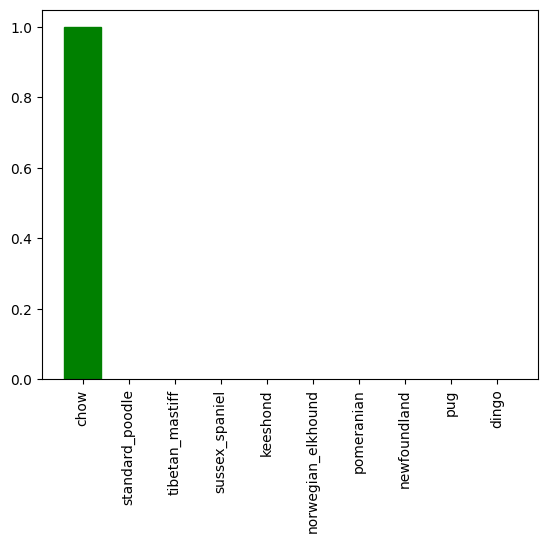

In [ ]:
plot_pred_conf(predictions,val_labels,n=100)

Now we've got some functions to help us visualize our predictions and evaluate our model. Let's check out a few

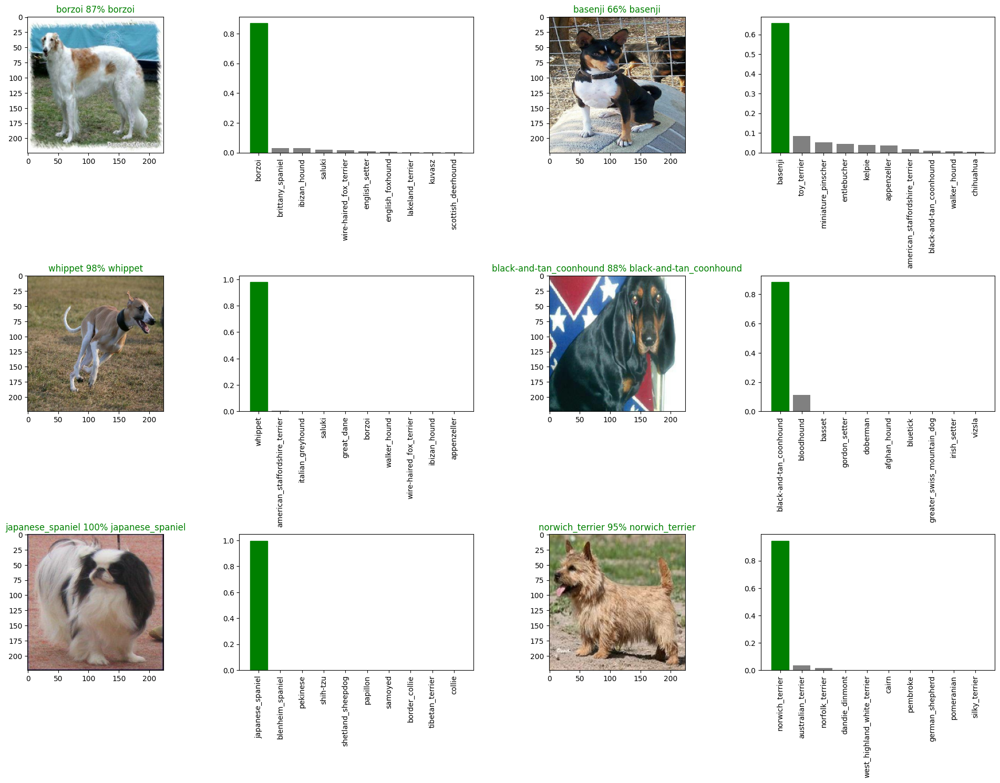

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier=600
num_rows = 3
num_cols=2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
                 labels=val_labels,
                 images=val_images,
                 n = i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n = i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

### Challenge: How would you create a confusion matrix with our models predictions and true labels?

To create a confusion matrix:

*  I want the actual labels( val_labels)
*  I want the predicted labels( predictied_labels )

In [ ]:
len(val_labels)

613

In [ ]:
get_pred_label(predictions[0])

'golden_retriever'

## Save and Reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model,suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string)
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join('/content/drive/MyDrive/Dog vision/models',
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  # save the model in the following format
  model_path = modeldir + '_' + suffix + '.h5'
  print(f'Saving model to: {model_path}...')
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from:{model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={'KerasLayer':hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on approx 3000 images
save_model(model,suffix='~3000-images-mobilenetv2-Adam')

NameError: ignored

In [ ]:
# load a trained model
loaded_3000_image_model = load_model('drive/MyDrive/Dog vision/models/20230727-15481690472888_~3000-images-mobilenetv2-Adam.h5')

NameError: ignored